In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage import data
from scipy.misc import imresize
from scipy.spatial.distance import cdist
from scipy.optimize._hungarian import linear_sum_assignment
import IPython.display as ipyd
import tensorflow as tf
from libs import utils, gif, datasets, dataset_utils, vae, dft

In [2]:
imgs = utils.get_celeb_imgs(max_images=256)

In [3]:
imgs = [imresize(img, (100, 100)) for img in imgs]

In [4]:
Xs = np.reshape(imgs, (-1, *imgs[0].shape))
Xs.shape

(244, 100, 100, 3)

In [5]:
ds = datasets.Dataset(Xs)
# ds = datasets.CIFAR10(flatten=False)

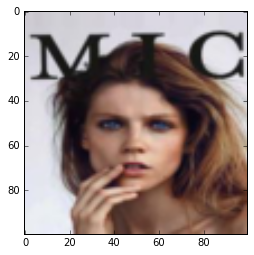

In [6]:
plt.imshow(ds.X[3])

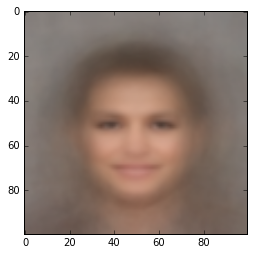

In [7]:
mean_img = ds.mean().astype(np.uint8)
plt.imshow(mean_img)

(100, 100, 3)

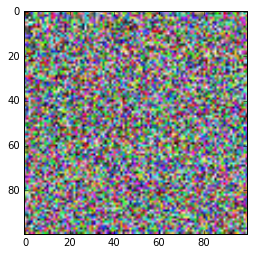

In [8]:
std_img = ds.std()
plt.imshow(std_img)
std_img.shape

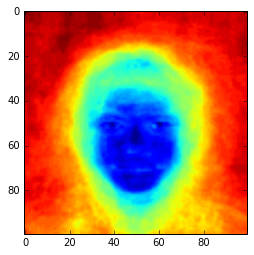

In [9]:
std_img = np.mean(std_img, axis=2).astype(np.uint8)
plt.imshow(std_img)

(244, 100, 100, 3)

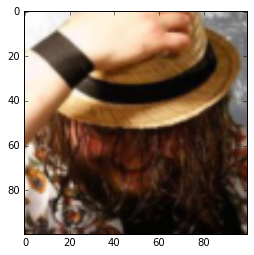

In [10]:
plt.imshow(ds.X[28])
ds.X.shape

In [11]:
def preprocess(img, ds):
    return (img - ds.mean()) / ds.std()

def deprocess(norm_img, ds):
    return norm_img * ds.std() + ds.mean()

assert np.allclose(deprocess(preprocess(ds.X[0], ds), ds), ds.X[0])

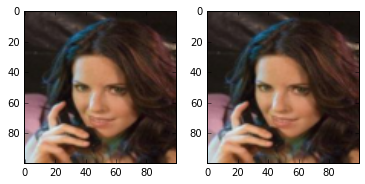

In [12]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(ds.X[0])
ax[1].imshow(deprocess(preprocess(ds.X[0], ds), ds).astype(np.uint8))

In [13]:
ds.X[0].shape

(100, 100, 3)

In [14]:
n_features = np.product(ds.X[0].shape)
n_features

30000

In [15]:
encoder_dimensions = [2048, 512, 128, 2]

In [16]:
tf.reset_default_graph()

In [17]:
X = tf.placeholder(tf.float32, shape=[None, n_features], name='X')
assert X.get_shape().as_list() == [None, n_features]

In [18]:
def encode(X, dimensions, activation=tf.nn.tanh):
    Ws = []
    for layer_i, n_output in enumerate(dimensions, 1):
        with tf.variable_scope('encoder'):
            h, W = utils.linear(x=X,
                                n_output=n_output,
                                activation=tf.nn.relu,
                                name='layer%d'%layer_i)
            Ws.append(W)
            X = h
    z = X
    return Ws, z

In [19]:
Ws, z = encode(X, encoder_dimensions)

assert z.get_shape().as_list() == [None, 2]
assert len(Ws) == len(encoder_dimensions)

In [20]:
[op.name for op in tf.get_default_graph().get_operations()]

['X',
 'encoder/layer1/W',
 'encoder/layer1/W/Initializer/random_uniform/shape',
 'encoder/layer1/W/Initializer/random_uniform/min',
 'encoder/layer1/W/Initializer/random_uniform/max',
 'encoder/layer1/W/Initializer/random_uniform/RandomUniform',
 'encoder/layer1/W/Initializer/random_uniform/sub',
 'encoder/layer1/W/Initializer/random_uniform/mul',
 'encoder/layer1/W/Initializer/random_uniform',
 'encoder/layer1/W/Assign',
 'encoder/layer1/W/read',
 'encoder/layer1/b',
 'encoder/layer1/b/Initializer/Const',
 'encoder/layer1/b/Assign',
 'encoder/layer1/b/read',
 'encoder/layer1/MatMul',
 'encoder/layer1/h',
 'encoder/layer1/Relu',
 'encoder/layer2/W',
 'encoder/layer2/W/Initializer/random_uniform/shape',
 'encoder/layer2/W/Initializer/random_uniform/min',
 'encoder/layer2/W/Initializer/random_uniform/max',
 'encoder/layer2/W/Initializer/random_uniform/RandomUniform',
 'encoder/layer2/W/Initializer/random_uniform/sub',
 'encoder/layer2/W/Initializer/random_uniform/mul',
 'encoder/layer2/

In [21]:
[W_i.get_shape().as_list() for W_i in Ws]

[[30000, 2048], [2048, 512], [512, 128], [128, 2]]

In [22]:
z.get_shape().as_list()

[None, 2]

In [23]:
decoder_Ws = Ws[::-1]

decoder_dimensions = encoder_dimensions[::-1][1:] + [n_features]
assert decoder_dimensions[-1] == n_features
decoder_dimensions

[128, 512, 2048, 30000]

In [24]:
def decode(z, dimensions, Ws, activation=tf.nn.tanh):
    current_input = z
    for layer_i, n_output in enumerate(dimensions):
        with tf.variable_scope('decoder/layer/{}'.format(layer_i+1)):
            W = tf.transpose(Ws[layer_i])
            h = tf.matmul(current_input, W)
            current_input = activation(h)
            n_input = n_output
    Y = current_input
    return Y

In [25]:
decoder_dimensions

[128, 512, 2048, 30000]

In [26]:
Y = decode(z, decoder_dimensions, decoder_Ws)

In [27]:
[op.name for op in tf.get_default_graph().get_operations()
 if op.name.startswith('decoder')]

['decoder/layer/1/transpose/Rank',
 'decoder/layer/1/transpose/sub/y',
 'decoder/layer/1/transpose/sub',
 'decoder/layer/1/transpose/Range/start',
 'decoder/layer/1/transpose/Range/delta',
 'decoder/layer/1/transpose/Range',
 'decoder/layer/1/transpose/sub_1',
 'decoder/layer/1/transpose',
 'decoder/layer/1/MatMul',
 'decoder/layer/1/Tanh',
 'decoder/layer/2/transpose/Rank',
 'decoder/layer/2/transpose/sub/y',
 'decoder/layer/2/transpose/sub',
 'decoder/layer/2/transpose/Range/start',
 'decoder/layer/2/transpose/Range/delta',
 'decoder/layer/2/transpose/Range',
 'decoder/layer/2/transpose/sub_1',
 'decoder/layer/2/transpose',
 'decoder/layer/2/MatMul',
 'decoder/layer/2/Tanh',
 'decoder/layer/3/transpose/Rank',
 'decoder/layer/3/transpose/sub/y',
 'decoder/layer/3/transpose/sub',
 'decoder/layer/3/transpose/Range/start',
 'decoder/layer/3/transpose/Range/delta',
 'decoder/layer/3/transpose/Range',
 'decoder/layer/3/transpose/sub_1',
 'decoder/layer/3/transpose',
 'decoder/layer/3/MatMu

In [28]:
Y.get_shape().as_list()

[None, 30000]

In [29]:
loss = tf.squared_difference(X, Y)
cost = tf.reduce_mean(tf.reduce_sum(loss))

In [30]:
learning_rate = .001
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

In [31]:
config = tf.ConfigProto(device_count={'GPU': 0})
# config.gpu_options.allow_growth = True
# config.gpu_options.per_process_gpu_memory_fraction = .9
sess = tf.Session(config=config)
sess.run(tf.initialize_all_variables())

0 292.636014344


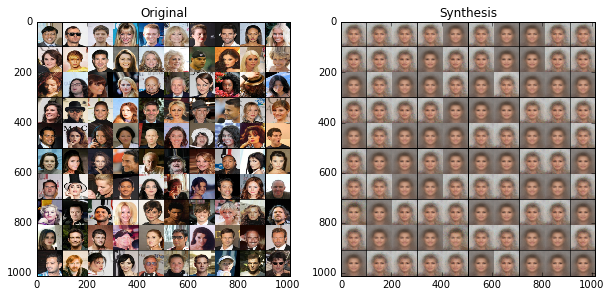

1 272.488990779
2 261.839964139
3 258.607602459
4 257.933447746
5 257.898913934
6 258.054887295
7 256.199595287
8 257.481142418
9 257.877797131
10 256.332028689


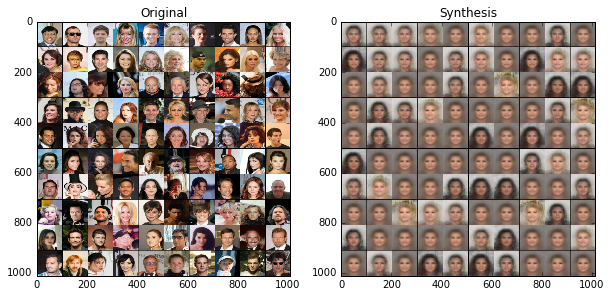

11 256.100435451
12 250.696419057
13 244.267110656
14 261.750881148
15 260.126265369
16 256.866536885
17 257.24625
18 256.654795082
19 257.538447746
20 256.953965164


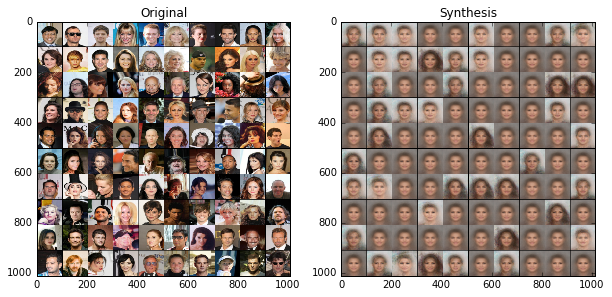

21 255.399544057
22 256.828237705
23 256.412807377
24 257.401039959
25 257.626844262
26 257.651659836
27 255.821711066
28 254.848709016
29 253.271577869
30 253.954779713


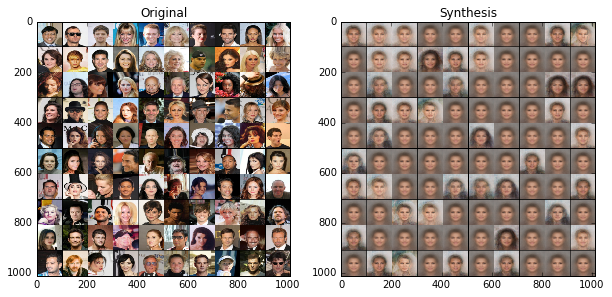

In [32]:
batch_size = 100
n_epochs = 31
step = 10

examples = ds.X[:100]

test_examples = preprocess(examples, ds).reshape(-1, n_features)

test_images = utils.montage(examples).astype(np.uint8)

gifs = []

for epoch_i in range(n_epochs):
    
    this_cost = 0
    
    for batch_X, _ in ds.train.next_batch(batch_size=batch_size):
        
        this_batch = preprocess(batch_X, ds).reshape(-1, n_features)
        
        this_cost += sess.run([cost, optimizer], feed_dict={X: this_batch})[0]
        
    avg_cost = this_cost / ds.X.shape[0] / batch_size
    print(epoch_i, avg_cost)
    
    if epoch_i % step == 0:
        
        recon = sess.run(Y, feed_dict={X: test_examples})
        
        rsz = recon.reshape(examples.shape)
        
        unnorm_img = deprocess(rsz, ds)
        
        clipped = np.clip(unnorm_img, 0, 255)
        
        recon = utils.montage(clipped).astype(np.uint8)
        
        gifs.append(recon)
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
        axs[0].imshow(test_images)
        axs[0].set_title('Original')
        axs[1].imshow(recon)
        axs[1].set_title('Synthesis')
        fig.canvas.draw()
        plt.show()

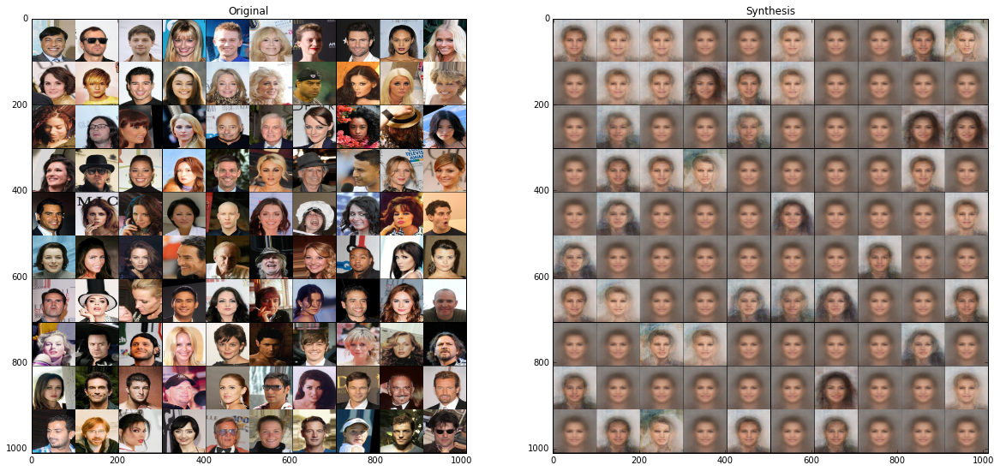

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(20, 20))
axs[0].imshow(test_images)
axs[0].set_title('Original')
axs[1].imshow(recon)
axs[1].set_title('Synthesis')
fig.canvas.draw()
plt.show()
plt.imsave(arr=test_images, fname='test.png')
plt.imsave(arr=recon, fname='recon.png')

In [34]:
zs = sess.run(z, feed_dict={X: test_examples})
zs.shape

(100, 2)

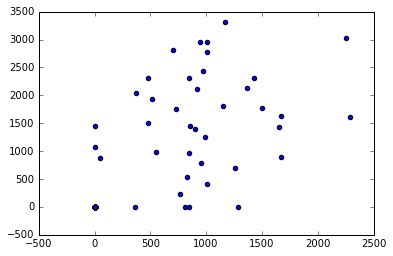

In [35]:
plt.scatter(zs[:, 0], zs[:, 1])

In [36]:
n_images = 100
idxs = np.linspace(np.min(zs) * 2., np.max(zs) * 2., int(np.ceil(np.sqrt(n_images))))
xs, ys = np.meshgrid(idxs, idxs)
grid = np.dstack((ys, xs)).reshape(-1, 2)[:n_images,:]

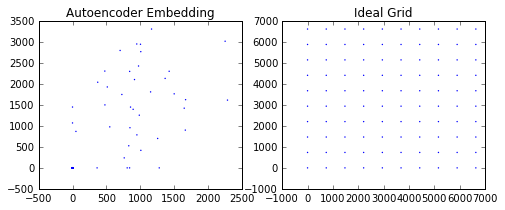

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3))
axs[0].scatter(zs[:, 0], zs[:, 1], edgecolors='none', marker='o', s=2)
axs[0].set_title('Autoencoder Embedding')
axs[1].scatter(grid[:,0], grid[:,1], edgecolors='none', marker='o', s=2)
axs[1].set_title('Ideal Grid')

In [38]:
cost = cdist(grid[:, :], zs[:, :], 'sqeuclidean')
indexes = linear_sum_assignment(cost)
indexes

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
 array([99, 98, 97, 95, 93, 90, 88, 87,  9, 92, 85, 84, 83, 82, 81, 79, 77,
        76, 33, 61, 75, 74, 71, 70, 68, 67, 63, 62, 89, 73, 59, 58, 56, 55,
        54, 53, 52, 51,  5, 15, 48, 47, 46, 44, 43, 42, 40, 72, 38, 49, 39,
        37, 36, 35, 34, 30, 27, 94, 60, 11, 26, 25, 23, 22, 20, 19, 96,  0,
        32,  2, 18, 17, 16, 10,  7,  6, 80, 31,  8, 12, 13,  4,  3, 45, 50,
        21, 65, 57, 91,  1, 86, 29, 28, 66, 41, 78, 64, 24, 14, 69]))

(-3, 3)

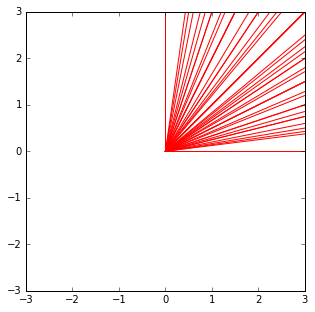

In [39]:
plt.figure(figsize=(5, 5))
for i in range(len(zs)):
    plt.plot([zs[indexes[1][i], 0], grid[i, 0]],
             [zs[indexes[1][i], 1], grid[i, 1]], 'r')
plt.xlim([-3, 3])
plt.ylim([-3, 3])

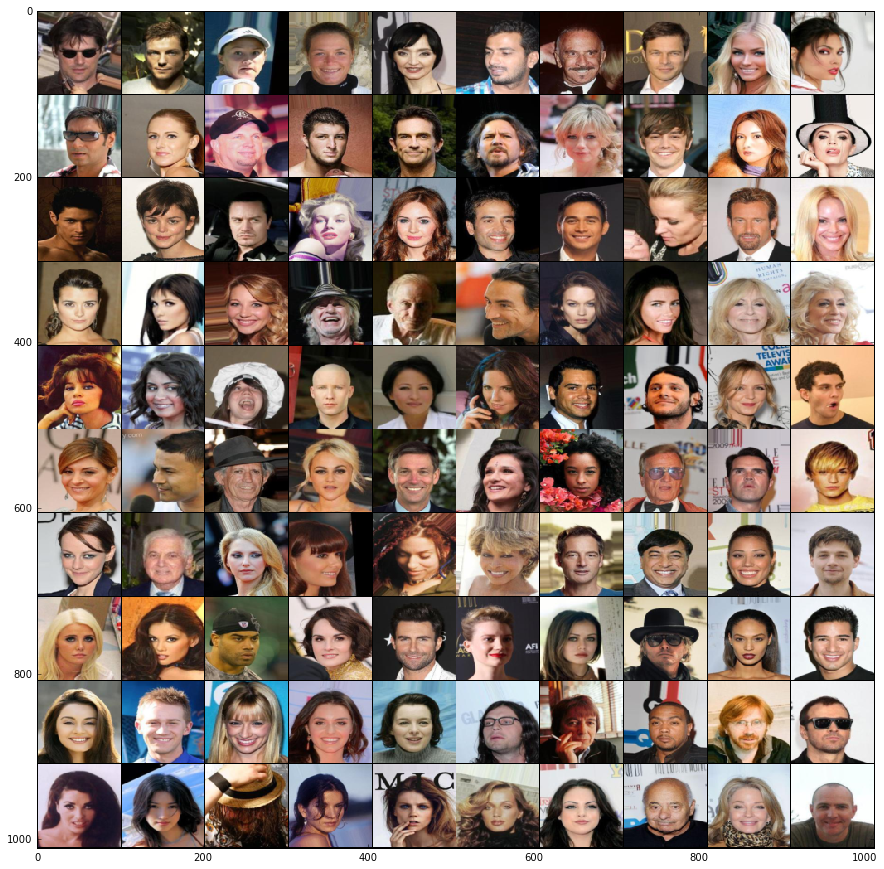

In [40]:
examples_sorted = []
for i in indexes[1]:
    examples_sorted.append(examples[i])
plt.figure(figsize=(15, 15))
img = utils.montage(np.array(examples_sorted)).astype(np.uint8)
plt.imshow(img, interpolation='nearest')
plt.imsave(arr=img, fname='sorted.png')

In [41]:
zs = np.meshgrid(np.linspace(-1, 1, 10), np.linspace(-1, 1, 10))
zs

[array([[-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.33333333,  0.55555556,  0.77777778,  1.        ],
        [-1.        , -0.77777778, -0.55555556, -0.33333333, -0.11111111,
          0.11111111,  0.3333333

In [42]:
zs = np.c_[zs[0].ravel(), zs[1].ravel()]
zs.shape

(100, 2)

In [43]:
recon = sess.run(Y, feed_dict={z: zs})
rsz = recon.reshape(examples.shape)
unnorm_img = deprocess(rsz, ds)
clipped = np.clip(unnorm_img, 0, 255)
img_i = utils.montage(clipped).astype(np.uint8)

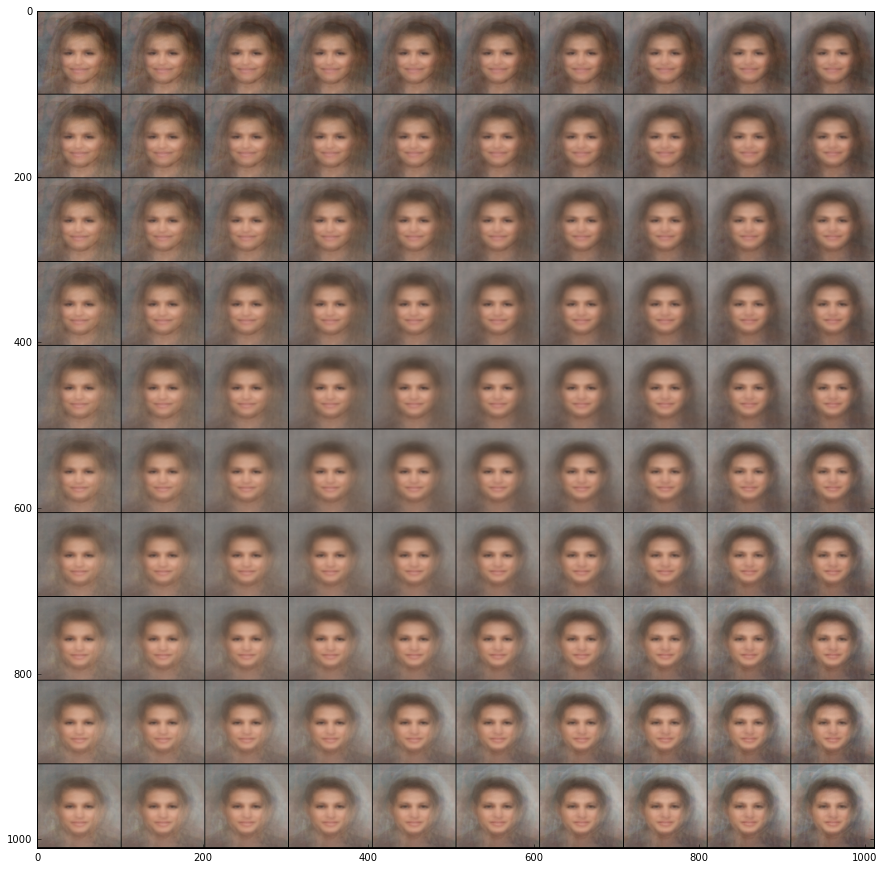

In [44]:
plt.figure(figsize=(15, 15))
plt.imshow(img_i)
plt.imsave(arr=img_i, fname='manifold.png')

In [45]:
some_dir = 'img_align_celeba'
files = [os.path.join(some_dir, file_i) for file_i in os.listdir(some_dir) if file_i.endswith('.jpg')]

In [46]:
vae.train_vae(files, 
              plt.imread(files[0]).shape,
              learning_rate=.0001,
              batch_size=100,
              n_epochs=50,
              n_examples=10,
              crop_shape=[64, 64, 3],
              crop_factor=0.8,
              n_filters=[100, 100, 100, 100],
              n_hidden=256,
              n_code=50,
              convolutional=True,
              variational=True,
              filter_sizes=[3, 3, 3, 3],
              dropout=True,
              keep_prob=.8,
              activation=tf.nn.relu,
              img_step=100,
              save_step=100,
              ckpt_name='vae.ckpt')

KeyboardInterrupt: 

In [47]:
dst = 'gtzan_music_speech'

music_dir = os.path.join(os.path.join(dst, 'music_speech'), 'music_wav')
music = [os.path.join(music_dir, file_i) for file_i in os.listdir(music_dir)
         if file_i.endswith('.wav')]

speech_dir = os.path.join(os.path.join(dst, 'music_speech'), 'speech_wav')
speech = [os.path.join(speech_dir, file_i) for file_i in os.listdir(speech_dir)
          if file_i.endswith('.wav')]
music, speech

(['gtzan_music_speech/music_speech/music_wav/bagpipe.wav',
  'gtzan_music_speech/music_speech/music_wav/ballad.wav',
  'gtzan_music_speech/music_speech/music_wav/bartok.wav',
  'gtzan_music_speech/music_speech/music_wav/beat.wav',
  'gtzan_music_speech/music_speech/music_wav/beatles.wav',
  'gtzan_music_speech/music_speech/music_wav/bigband.wav',
  'gtzan_music_speech/music_speech/music_wav/birdland.wav',
  'gtzan_music_speech/music_speech/music_wav/blues.wav',
  'gtzan_music_speech/music_speech/music_wav/bmarsalis.wav',
  'gtzan_music_speech/music_speech/music_wav/brahms.wav',
  'gtzan_music_speech/music_speech/music_wav/canonaki.wav',
  'gtzan_music_speech/music_speech/music_wav/caravan.wav',
  'gtzan_music_speech/music_speech/music_wav/chaka.wav',
  'gtzan_music_speech/music_speech/music_wav/classical.wav',
  'gtzan_music_speech/music_speech/music_wav/classical1.wav',
  'gtzan_music_speech/music_speech/music_wav/classical2.wav',
  'gtzan_music_speech/music_speech/music_wav/copland.w

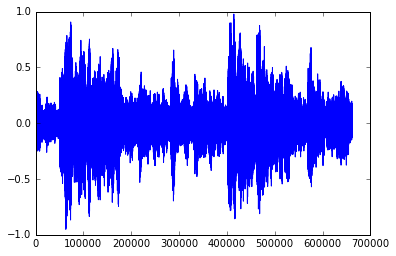

In [48]:
file_i = music[0]
s = utils.load_audio(file_i)
plt.plot(s)

(2583, 256)

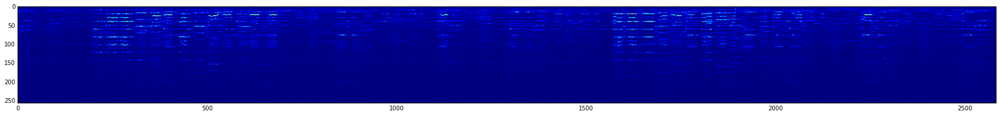

In [49]:
fft_size = 512
hop_size = 256

re, im = dft.dft_np(s, hop_size=hop_size, fft_size=fft_size)
mag, phs = dft.ztoc(re, im)
plt.figure(figsize=(30, 30))
plt.imshow(mag.T)
mag.shape

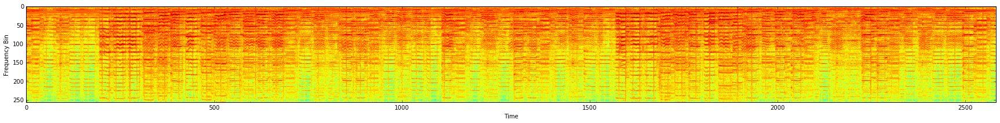

In [50]:
plt.figure(figsize=(30, 30))
plt.imshow(np.log(mag.T))
plt.xlabel('Time')
plt.ylabel('Frequency Bin')

In [51]:
sr = 22050

n_frames_per_second = sr // hop_size

n_frames = n_frames_per_second // 2
frame_hops = n_frames_per_second // 4

n_hops = (len(mag) - n_frames) // frame_hops

In [52]:
n_frames_per_second, n_frames, frame_hops, n_hops

(86, 43, 21, 120)

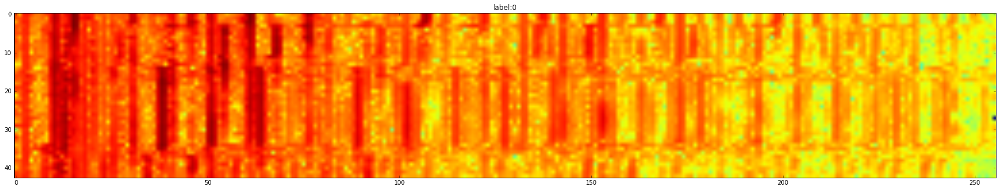

In [53]:
Xs = []
ys = []

for hop_i in range(n_hops):
    frames = mag[(hop_i * frame_hops):(hop_i * frame_hops + n_frames)]
    Xs.append(np.log(abs(frames[..., np.newaxis]) + 1e-10))
    ys.append(0)

plt.figure(figsize=(30, 30))
plt.imshow(Xs[0][..., 0])
plt.title('label:{}'.format(ys[1]))

In [54]:
Xs, ys = [], []

for i in music:
    s = utils.load_audio(i)
    re, im = dft.dft_np(s, fft_size=fft_size, hop_size=hop_size)
    mag, phs = dft.ztoc(re, im)
    n_hops = (len(mag) - n_frames) // frame_hops
    for hop_i in range(n_hops):
        frames = mag[(hop_i*frame_hops):(hop_i*frame_hops+n_frames)]
        this_X = np.log(np.abs(frames[..., np.newaxis]) + 1e-10)
        Xs.append(this_X)
        ys.append(0)
        
for i in speech:
    s = utils.load_audio(i)
    re, im = dft.dft_np(s, fft_size=fft_size, hop_size=hop_size)
    mag, phs = dft.ztoc(re, im)
    n_hops = (len(mag) - n_frames) // frame_hops
    for hop_i in range(n_hops):
        frames = mag[(hop_i*frame_hops):(hop_i*frame_hops+n_frames)]
        this_X = np.log(np.abs(frames[..., np.newaxis])+1e-10)
        Xs.append(this_X)
        ys.append(1)
        
Xs = np.array(Xs)
ys = np.array(ys)

assert Xs.shape == (15360, 43, 256, 1) and ys.shape == (15360,)
Xs.shape, ys.shape

((15360, 43, 256, 1), (15360,))

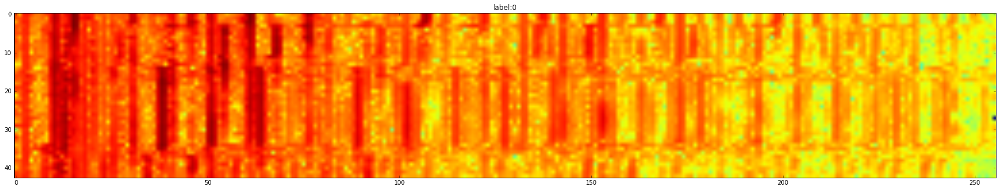

In [55]:
plt.figure(figsize=(30, 30))
plt.imshow(Xs[0][..., 0])
plt.title('label:{}'.format(ys[0]))

In [56]:
n_observations, n_height, n_width, n_channels = Xs.shape

In [57]:
ds = datasets.Dataset(Xs=Xs, ys=ys, split=[0.8, 0.1, 0.1], one_hot=True)

In [58]:
Xs_i, ys_i = next(ds.train.next_batch())
assert ys_i.shape == (100, 2)
Xs_i.shape, ys_i.shape

((100, 43, 256, 1), (100, 2))

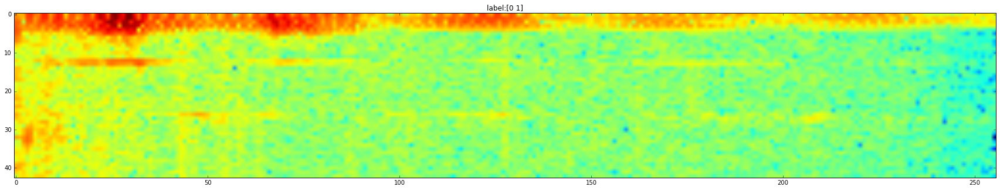

In [59]:
plt.figure(figsize=(30, 30))
plt.imshow(Xs_i[1, :, :, 0])
plt.title('label:{}'.format(ys_i[1]))

In [60]:
tf.reset_default_graph()

X = tf.placeholder(name='X', shape=[None, n_height, n_width, n_channels], dtype=tf.float32)
Y = tf.placeholder(name='Y', shape=[None, 2], dtype=tf.float32)

In [61]:
n_filters = [9, 9, 9, 9]

H = X
for layer_i, n_filters_i in enumerate(n_filters):
    H, W = utils.conv2d(H, n_filters_i, k_h=3, k_w=3, d_h=2, d_w=2,
                        name=str(layer_i))
    
    H = tf.nn.relu(H)
    
    print(H.get_shape().as_list())

[None, 22, 128, 9]
[None, 11, 64, 9]
[None, 6, 32, 9]
[None, 3, 16, 9]


In [62]:
fc, W = utils.linear(H, 32, activation=tf.nn.relu, name='layer1')
Y_pred, W = utils.linear(fc, 2, activation=tf.nn.softmax, 
                         name='layer2')

In [63]:
loss = utils.binary_cross_entropy(Y_pred, Y)
cost = tf.reduce_mean(tf.reduce_sum(loss, 1))

In [64]:
predicted_y = tf.argmax(Y_pred, 1)
actual_y = tf.argmax(Y, 1)
correct_prediction = tf.equal(predicted_y, actual_y)
accuracy = tf.reduce_mean(tf.cast(correct_prediction, 'float'))

In [65]:
learning_rate = .0001
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

In [66]:
n_epochs = 10
batch_size = 200

config = tf.ConfigProto(device_count={'GPU': 0})
sess = tf.Session(config=config)
sess.run(tf.initialize_all_variables())

for epoch_i in range(n_epochs):
    print('Epoch: ', epoch_i)
    
    this_accuracy = 0
    its = 0
    
    for Xs_i, ys_i in ds.train.next_batch(batch_size):
        this_accuracy += sess.run([accuracy, optimizer], 
                                  feed_dict={X: Xs_i, Y: ys_i})[0]
        its += 1
        print(this_accuracy / its)
    print('Training accuracy: ', this_accuracy/its)
    
    this_accuracy = 0
    its = 0
    
    for Xs_i, ys_i in ds.valid.next_batch(batch_size):
        this_accuracy += sess.run(accuracy, feed_dict={X: Xs_i, Y: ys_i})
        its += 1
    print('Validation accuracy: ', this_accuracy/its)

Epoch:  0
0.550000011921
0.539999991655
0.511666665475
0.51249999553
0.497999995947
0.50166666011
0.504999990974
0.509374994785
0.511666658852
0.513999995589
0.505909087983
0.507083329062
0.508076917667
0.503928565553
0.507666661342
0.502812495455
0.502058819813
0.503055550986
0.501842100369
0.503499996662
0.506666663147
0.504318179055
0.504999996527
0.502916663885
0.50279999733
0.500961536398
0.502592591224
0.503749999617
0.505172413999
0.507166666786
0.508709677765
0.509687501006
0.510000000397
0.514117646743
0.513999999421
0.514999999768
0.516621621074
0.517236842137
0.519487180007
0.521249999851
0.52304878104
0.527738096459
0.528255815423
0.530000001869
0.532111112939
0.534239132119
0.536276597292
0.537291667735
0.539285715137
0.540500001311
0.542254903153
0.544326923788
0.546603774687
0.547962964133
0.548363637382
0.549553572599
0.55017543937
0.550689655645
0.552033898689
0.553250000377
0.554344262745
0.55548387141
Training accuracy:  0.55548387141
Validation accuracy:  0.60308822

In [67]:
g = tf.get_default_graph()
[op.name for op in g.get_operations()]

['X',
 'Y',
 '0/W',
 '0/W/Initializer/random_uniform/shape',
 '0/W/Initializer/random_uniform/min',
 '0/W/Initializer/random_uniform/max',
 '0/W/Initializer/random_uniform/RandomUniform',
 '0/W/Initializer/random_uniform/sub',
 '0/W/Initializer/random_uniform/mul',
 '0/W/Initializer/random_uniform',
 '0/W/Assign',
 '0/W/read',
 '0/conv',
 '0/b',
 '0/b/Initializer/Const',
 '0/b/Assign',
 '0/b/read',
 '0/h',
 'Relu',
 '1/W',
 '1/W/Initializer/random_uniform/shape',
 '1/W/Initializer/random_uniform/min',
 '1/W/Initializer/random_uniform/max',
 '1/W/Initializer/random_uniform/RandomUniform',
 '1/W/Initializer/random_uniform/sub',
 '1/W/Initializer/random_uniform/mul',
 '1/W/Initializer/random_uniform',
 '1/W/Assign',
 '1/W/read',
 '1/conv',
 '1/b',
 '1/b/Initializer/Const',
 '1/b/Assign',
 '1/b/read',
 '1/h',
 'Relu_1',
 '2/W',
 '2/W/Initializer/random_uniform/shape',
 '2/W/Initializer/random_uniform/min',
 '2/W/Initializer/random_uniform/max',
 '2/W/Initializer/random_uniform/RandomUnifor

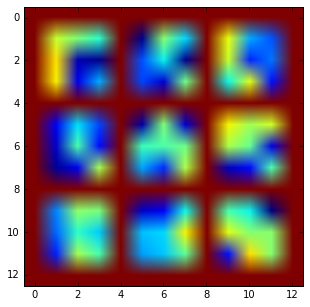

In [68]:
g = tf.get_default_graph()
W = np.array(g.get_tensor_by_name('0/W:0').eval(session=sess))

assert W.dtype == np.float32
m = utils.montage_filters(W)
plt.figure(figsize=(5, 5))
plt.imshow(m)
plt.imsave(arr=m, fname='audio.png')

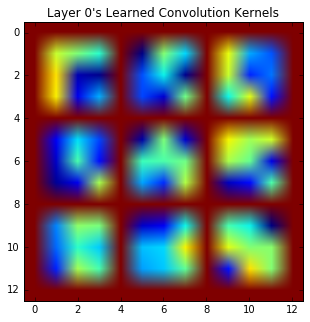

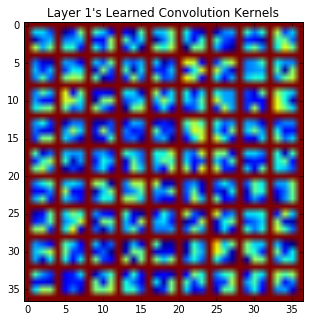

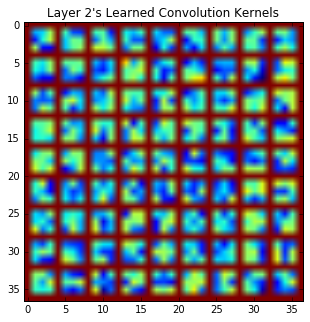

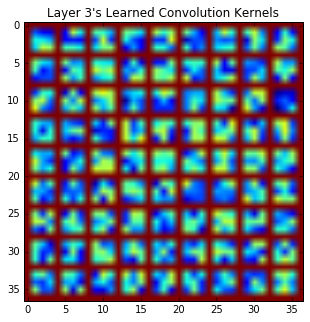

In [69]:
g = tf.get_default_graph()
for layer_i in range(len(n_filters)):
    W = sess.run(g.get_tensor_by_name('{}/W:0'.format(layer_i)))
    plt.figure(figsize=(5, 5))
    plt.imshow(utils.montage_filters(W))
    plt.title('Layer {}\'s Learned Convolution Kernels'.format(layer_i))

In [70]:
utils.build_submission('session-3.zip', 
                       ('test.png',
                        'recon.png',
                        'sorted.png',
                        'manifold.png',
                        'test_xs.png',
                        'audio.png',
                        'session-3.ipynb'))

Your assignment zip file has been created!
Now submit the file:
/Users/km/Dropbox/notebooks/kadenze/CADL/session-3/session-3.zip
to Kadenze for grading!
